# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [7]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [8]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = torch.mean((gradient_norm - 1)**2)
    #### END CODE HERE ####
    return penalty

In [9]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [10]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -1. * torch.mean(crit_fake_pred)
    #### END CODE HERE ####
    return gen_loss

In [11]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [12]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    #### END CODE HERE ####
    return crit_loss

In [13]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.09123214104678481, critic loss: 1.901277511954307


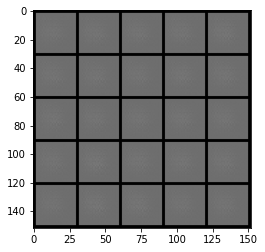

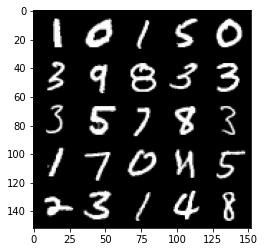

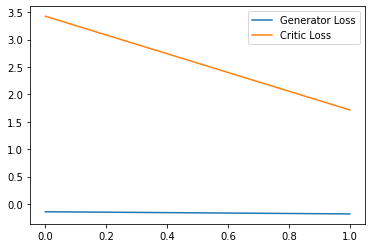

Step 100: Generator loss: 0.7225730670988559, critic loss: -1.74717826461792


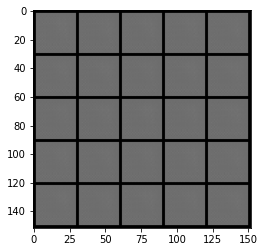

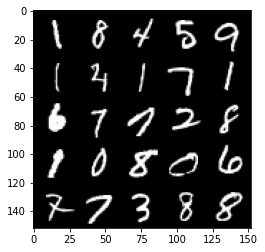

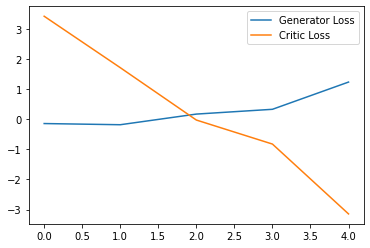

Step 150: Generator loss: 3.0109636959433557, critic loss: -11.725549083709714


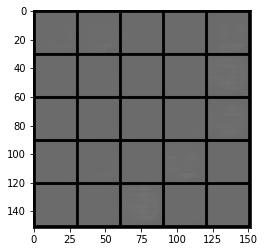

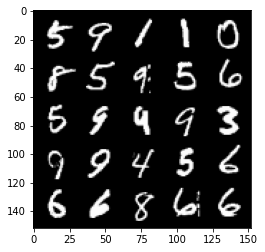

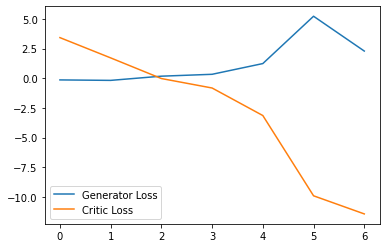

Step 200: Generator loss: -1.036117438673973, critic loss: -27.835853321075437


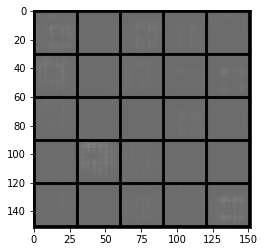

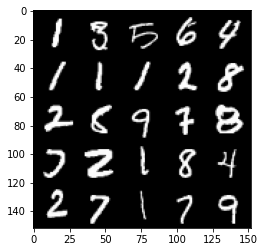

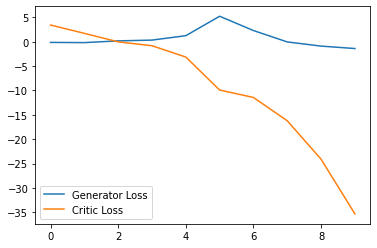

Step 250: Generator loss: -2.5034384763240816, critic loss: -60.748327552795416


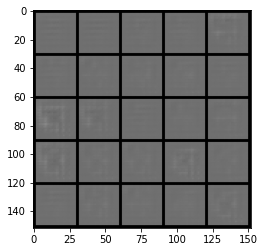

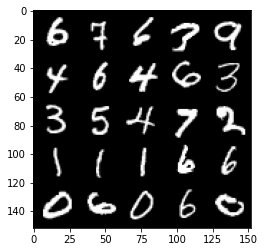

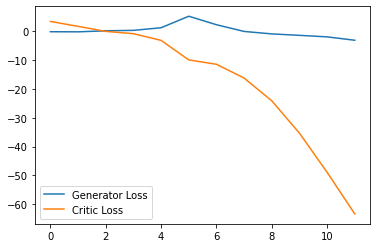

Step 300: Generator loss: -1.3730781608074905, critic loss: -104.5050768737793


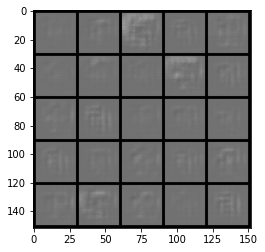

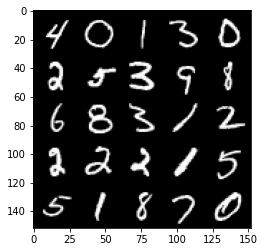

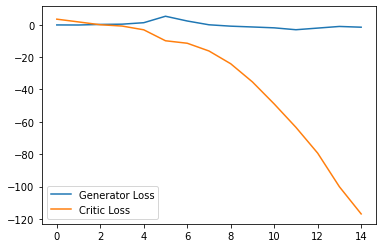

Step 350: Generator loss: 0.46454951256513594, critic loss: -155.50163162231448


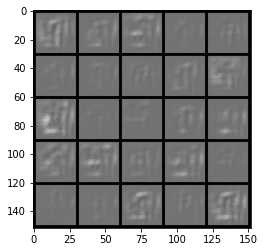

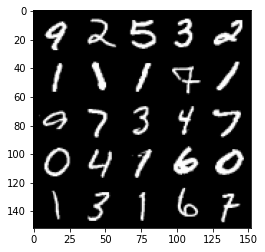

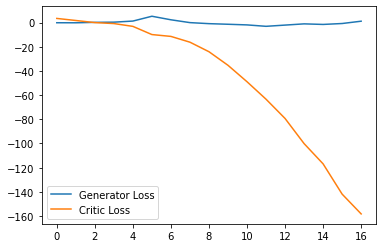

Step 400: Generator loss: 4.365652731657028, critic loss: -209.36369570922852


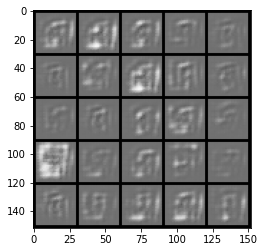

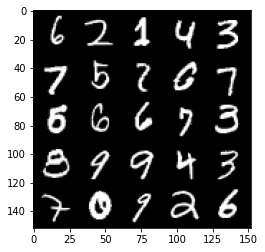

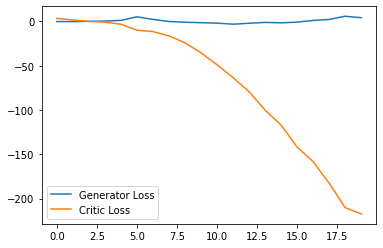

Step 450: Generator loss: -19.74449849128723, critic loss: -168.59463888549803


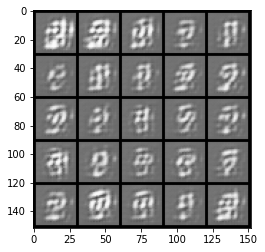

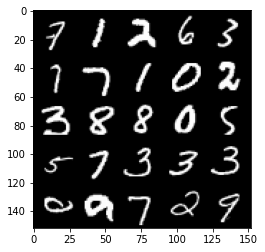

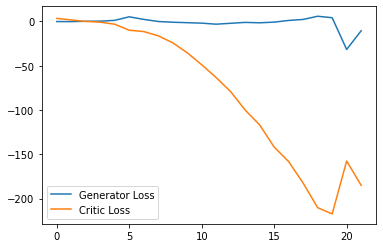

Step 500: Generator loss: 6.619524946212769, critic loss: -230.55549813842777


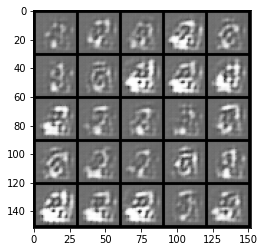

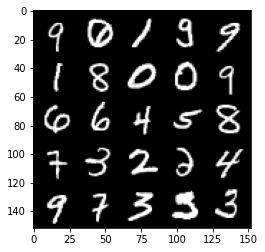

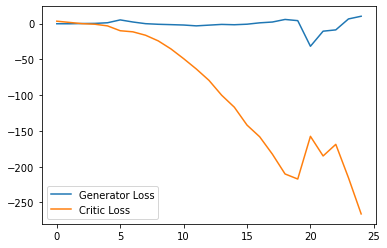

Step 550: Generator loss: -6.869907259345054, critic loss: -275.91997433471676


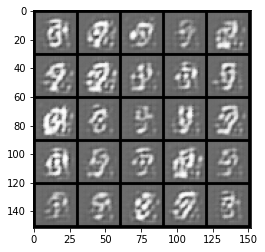

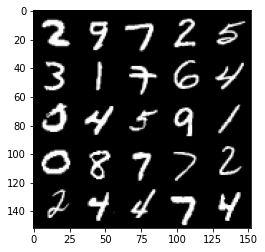

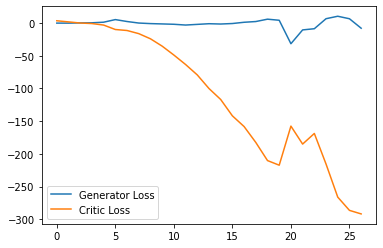

Step 600: Generator loss: 7.688275183141232, critic loss: -334.77269744873047


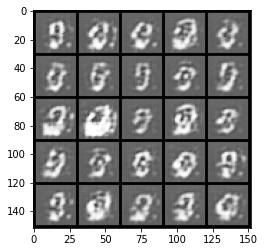

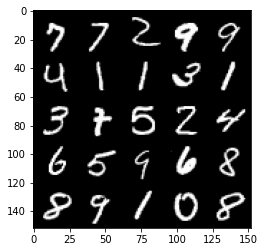

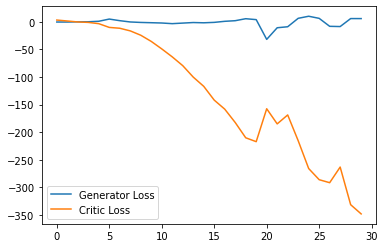

Step 650: Generator loss: -16.8047177696228, critic loss: -293.61579867553706


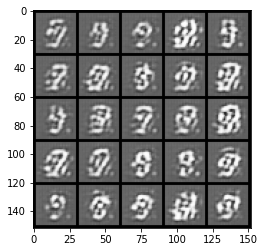

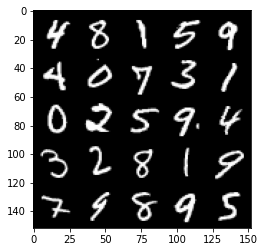

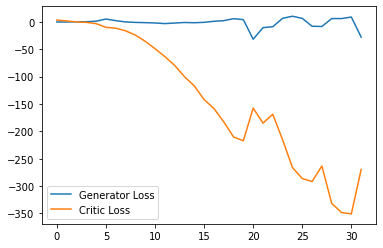

Step 700: Generator loss: -21.25220968723297, critic loss: -271.4022326049805


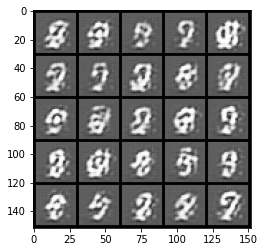

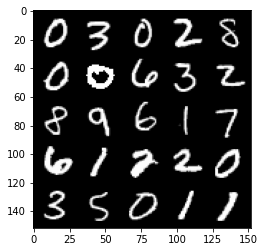

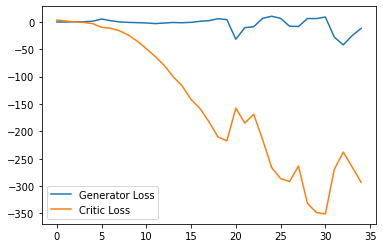

Step 750: Generator loss: -1.1600509309768676, critic loss: -295.7209765625


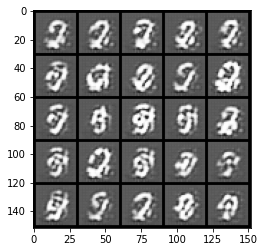

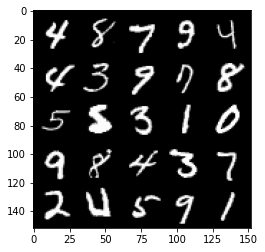

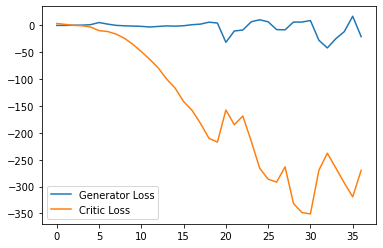

Step 800: Generator loss: -22.236573969125747, critic loss: -281.016403137207


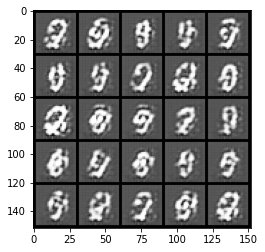

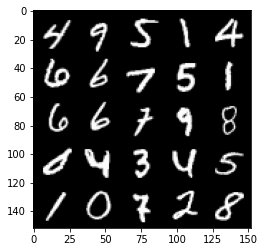

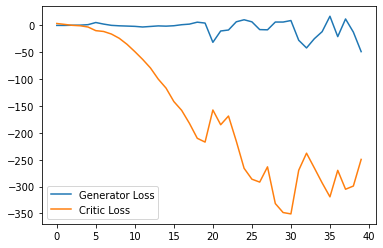

Step 850: Generator loss: 1.6586972451210023, critic loss: -284.7613424072266


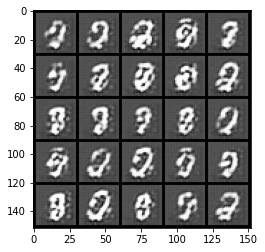

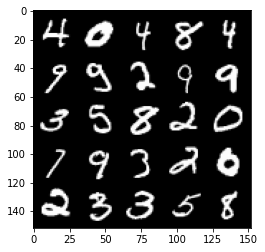

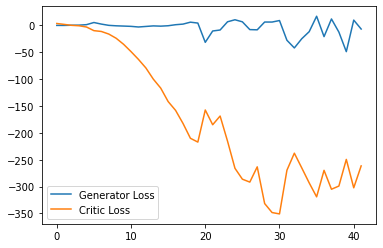

Step 900: Generator loss: -24.15850305557251, critic loss: -257.4995329284668


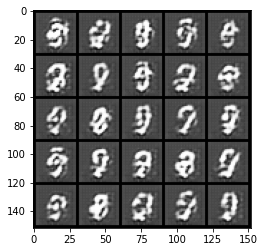

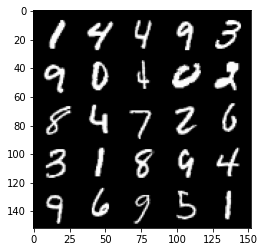

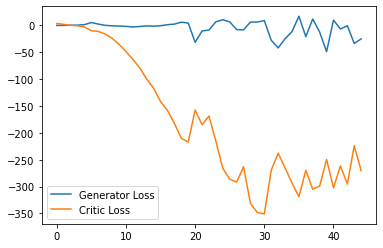

Step 950: Generator loss: -35.42486960947514, critic loss: -227.37553622436525


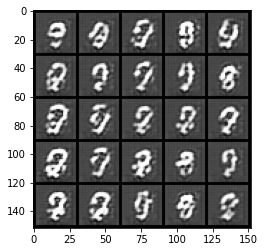

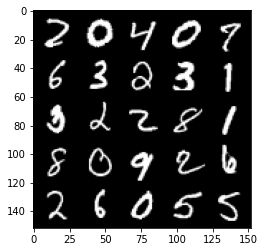

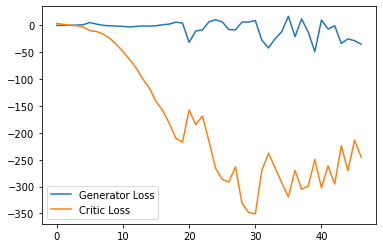

Step 1000: Generator loss: -38.78957678556442, critic loss: -262.91528939819347


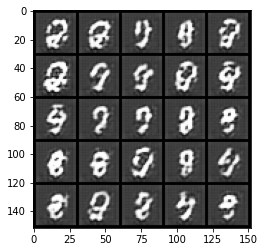

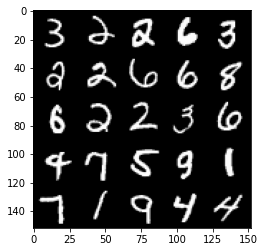

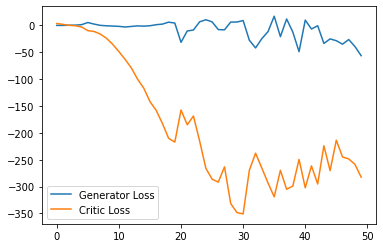

Step 1050: Generator loss: -17.345296614170074, critic loss: -198.94299375915526


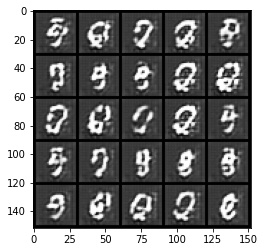

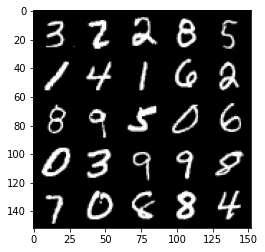

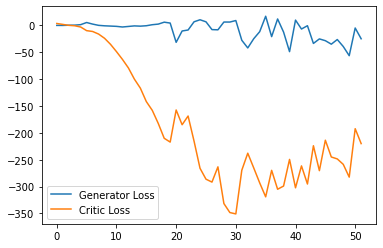

Step 1100: Generator loss: -51.78058901786804, critic loss: -161.32706170654293


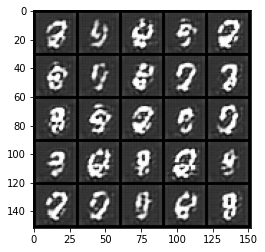

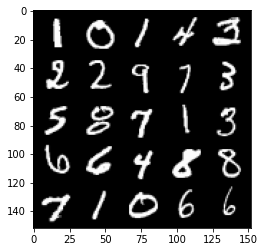

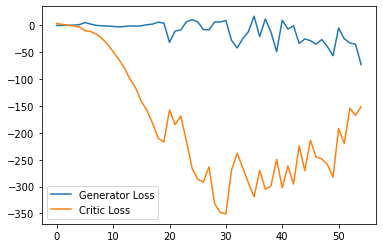

Step 1150: Generator loss: -48.73233092308045, critic loss: -155.1687246551514


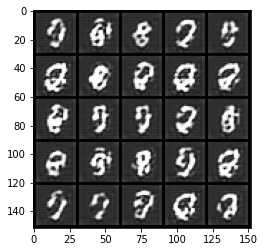

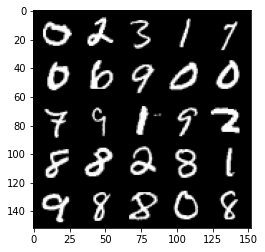

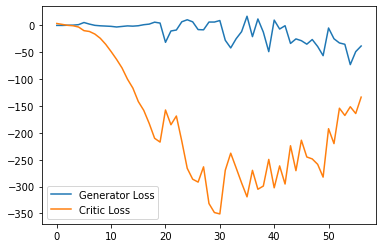

Step 1200: Generator loss: -5.744835953712464, critic loss: 14.415509723663334


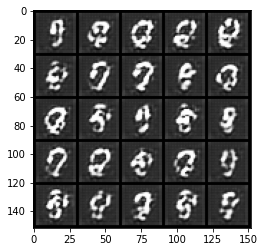

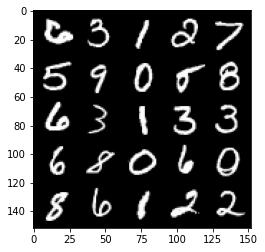

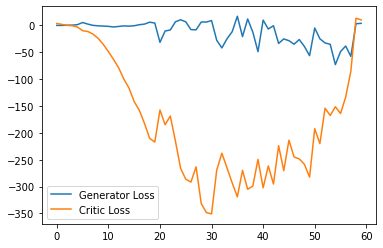

Step 1250: Generator loss: -9.940265999138354, critic loss: 5.284669120788578


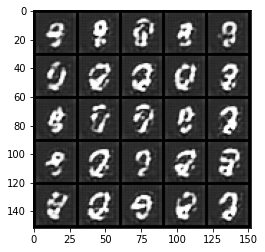

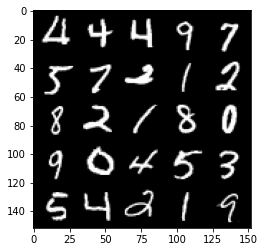

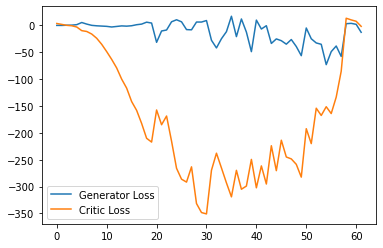

Step 1300: Generator loss: 15.81046709060669, critic loss: 6.6681205825805705


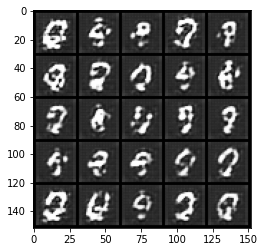

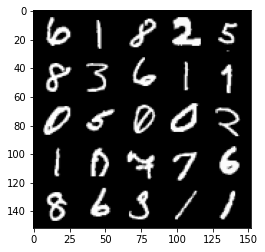

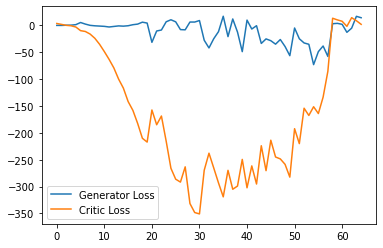

Step 1350: Generator loss: -23.599047749042512, critic loss: -41.20069727325439


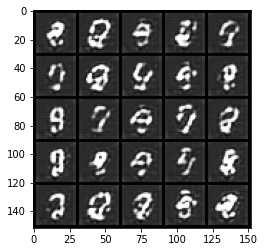

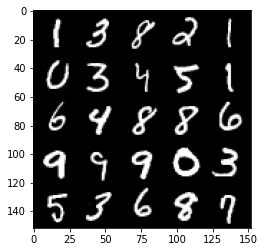

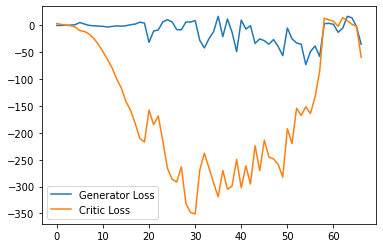

Step 1400: Generator loss: -8.842330989837647, critic loss: -30.1171434173584


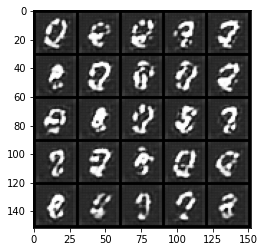

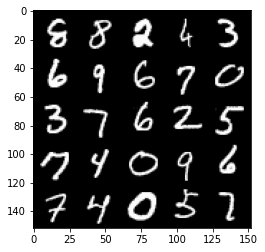

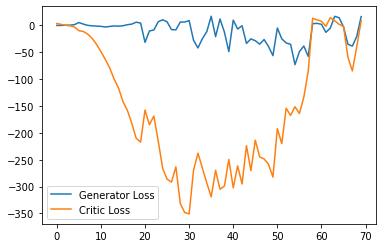

Step 1450: Generator loss: 3.462698132991791, critic loss: 3.152885746002198


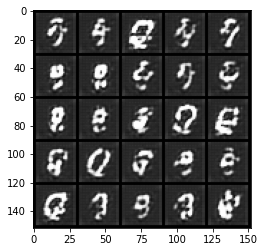

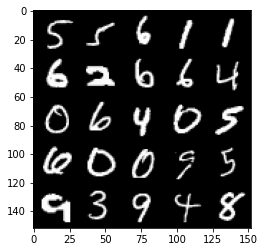

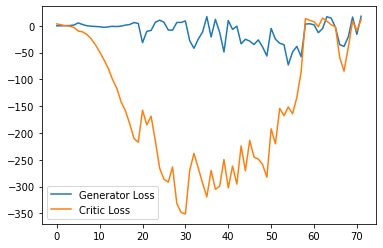

Step 1500: Generator loss: -19.371320333480835, critic loss: -26.87224361038208


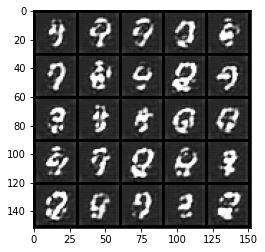

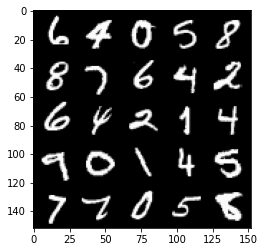

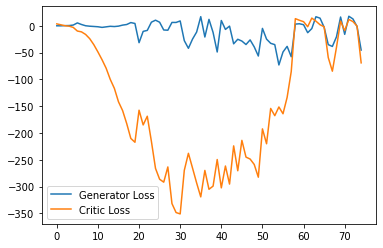

Step 1550: Generator loss: -32.259296176433566, critic loss: -56.992941436767566


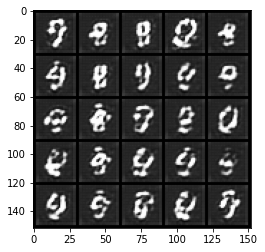

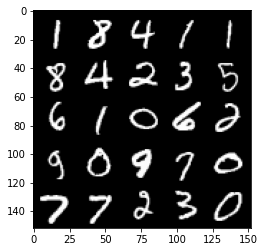

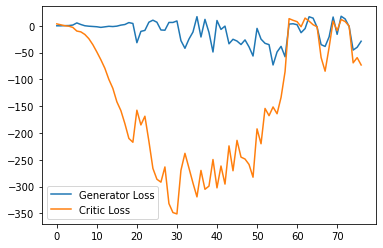

Step 1600: Generator loss: -44.98230705738067, critic loss: -50.749289203643805


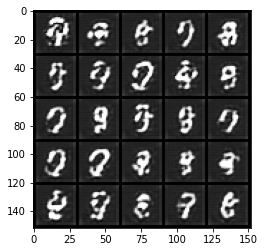

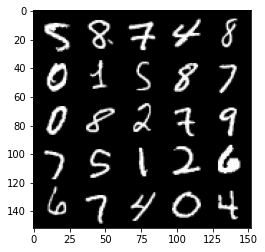

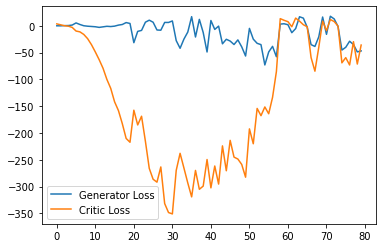

Step 1650: Generator loss: -7.242296792864799, critic loss: 1.6622354545593259


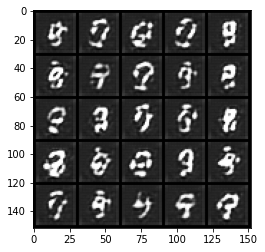

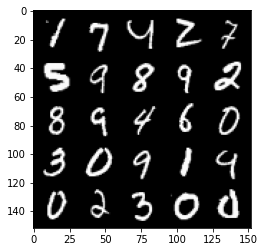

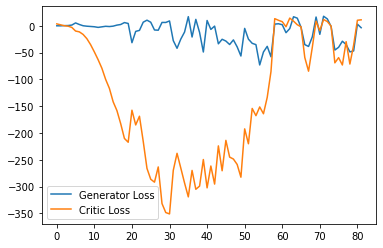

Step 1700: Generator loss: -9.281358623504639, critic loss: -15.162130065917973


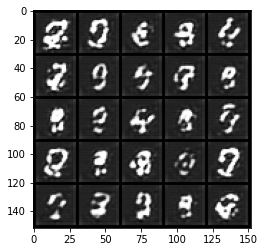

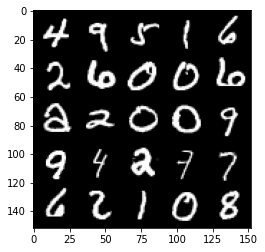

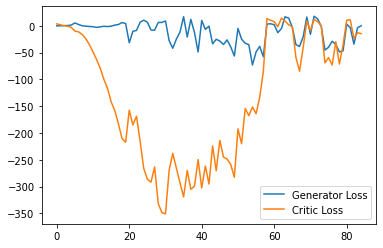

Step 1750: Generator loss: -1.6035178256034852, critic loss: 20.981623416900632


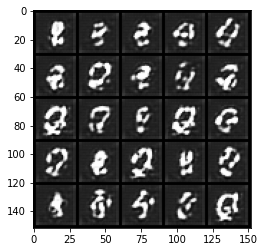

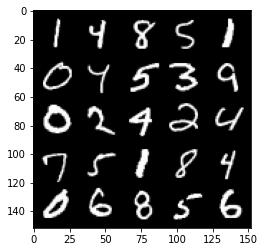

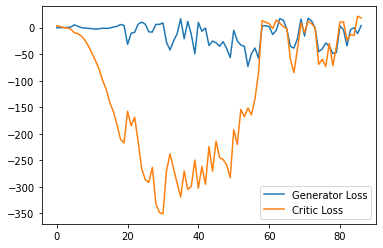

Step 1800: Generator loss: 0.9847160448879003, critic loss: 17.0514997959137


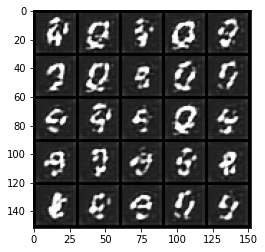

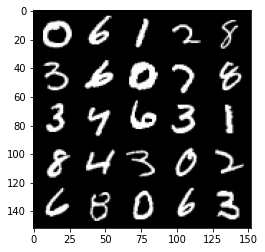

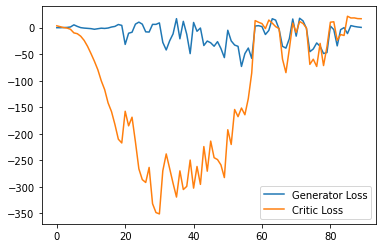

Step 1850: Generator loss: -0.2532950020954013, critic loss: 12.78611435127258


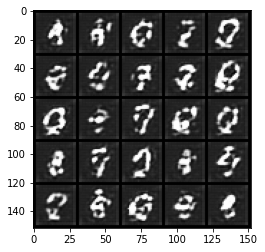

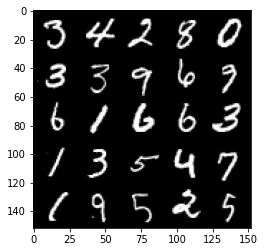

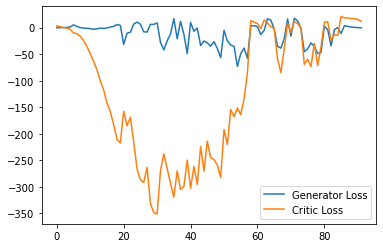

Step 1900: Generator loss: -1.1407402017712593, critic loss: 7.114515846252443


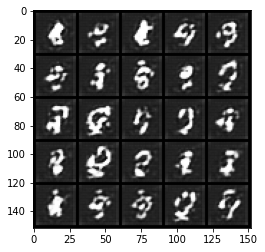

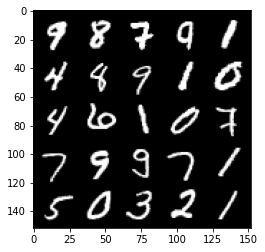

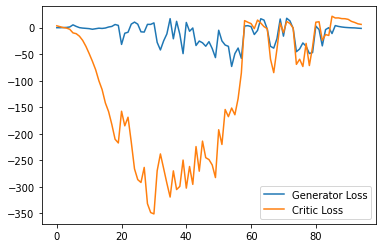

Step 1950: Generator loss: -1.6356985926628114, critic loss: 7.007339128494261


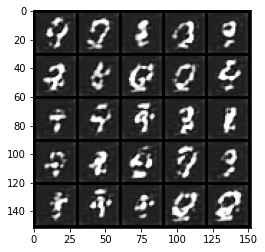

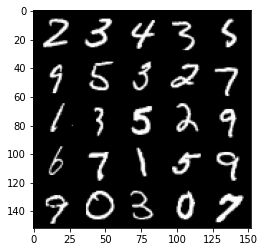

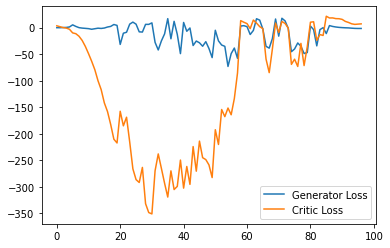

Step 2000: Generator loss: -1.179294758439064, critic loss: 9.795113985061644


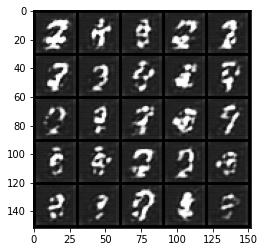

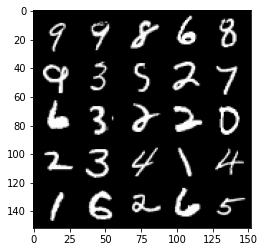

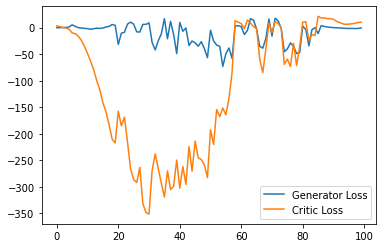

Step 2050: Generator loss: 1.2735711240768433, critic loss: 9.455437391281128


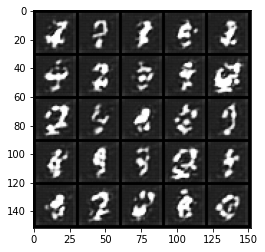

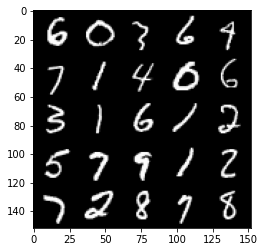

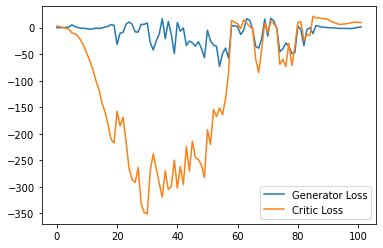

Step 2100: Generator loss: 4.352348213195801, critic loss: 7.765402658462523


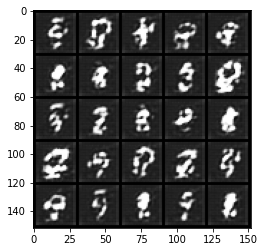

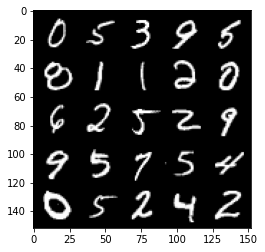

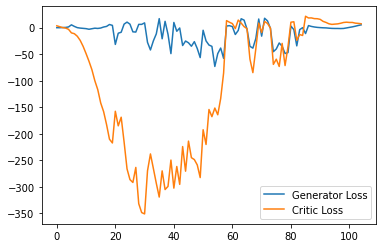

Step 2150: Generator loss: 7.522331447601318, critic loss: 7.348144035339354


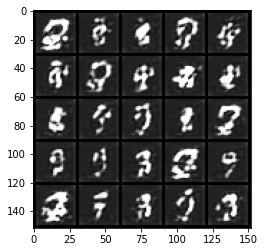

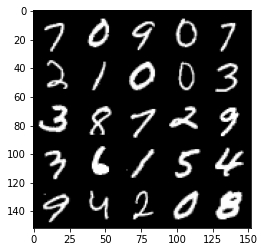

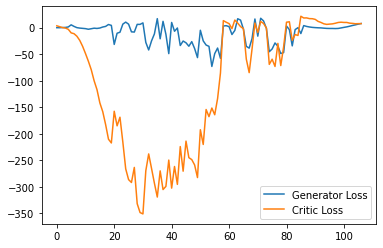

Step 2200: Generator loss: 10.385270805358887, critic loss: 5.483470954895019


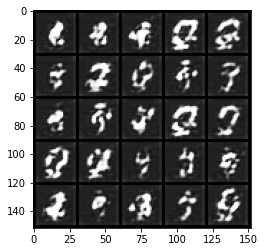

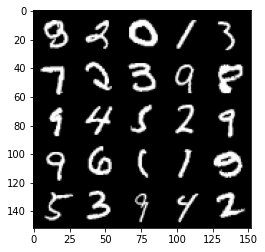

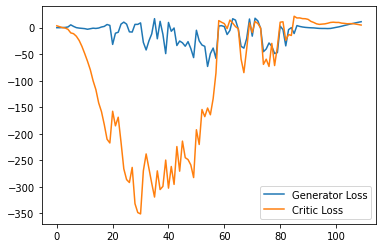

Step 2250: Generator loss: 12.700267200469971, critic loss: 3.6281827487945577


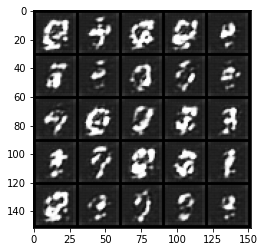

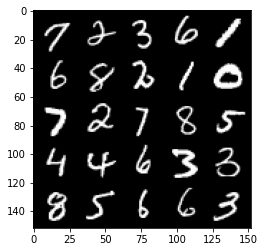

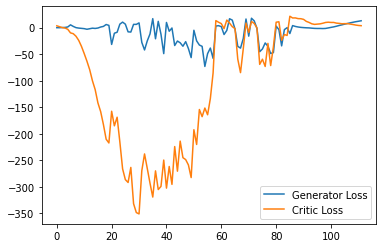

Step 2300: Generator loss: 14.405936870574951, critic loss: 1.6982589569091793


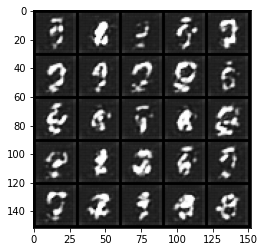

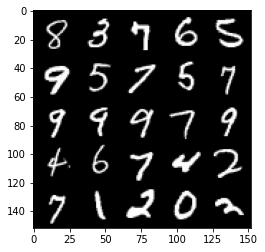

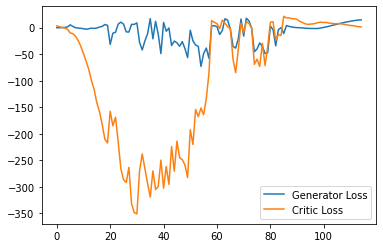

Step 2350: Generator loss: 15.05663080215454, critic loss: 0.4029522066116332


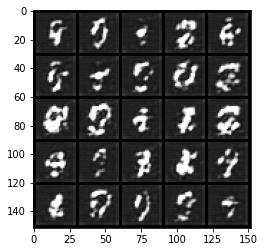

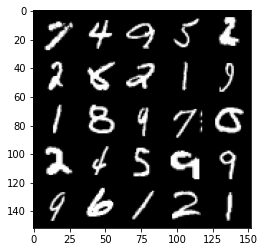

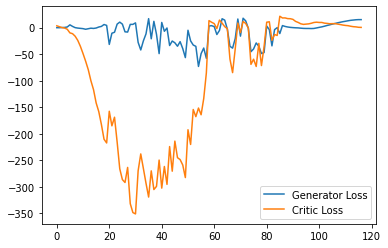

Step 2400: Generator loss: 14.697484970092773, critic loss: -0.4463945589065552


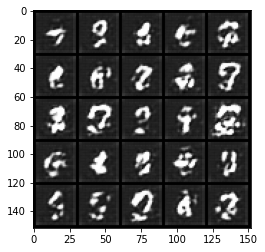

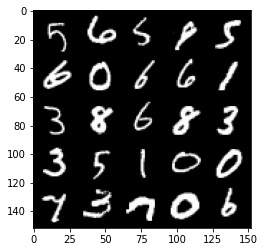

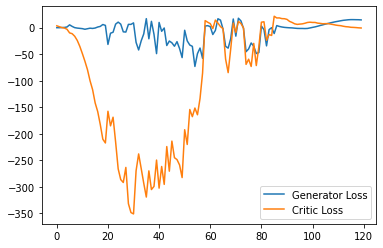

Step 2450: Generator loss: 13.910347366333008, critic loss: -1.5476804018020627


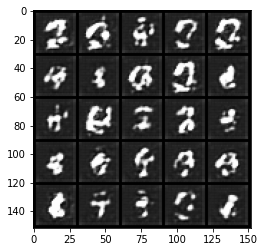

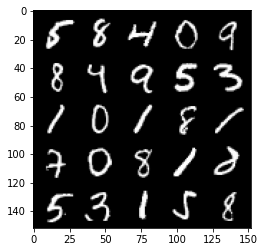

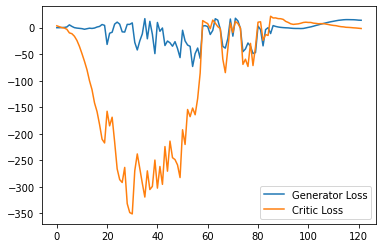

Step 2500: Generator loss: 12.595014667510986, critic loss: -2.2901543750762934


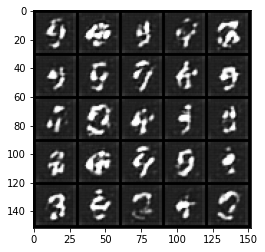

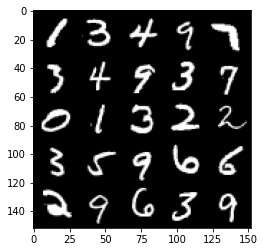

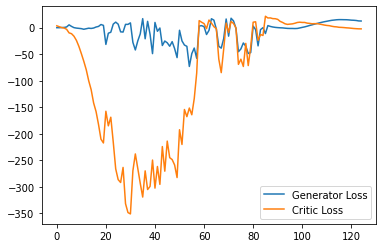

Step 2550: Generator loss: 12.403316059112548, critic loss: -3.162504132270813


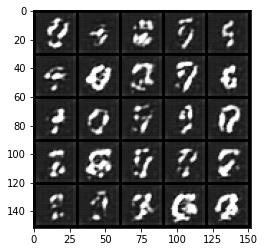

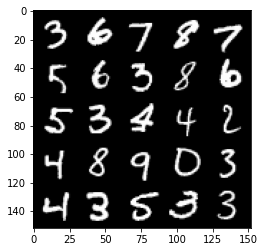

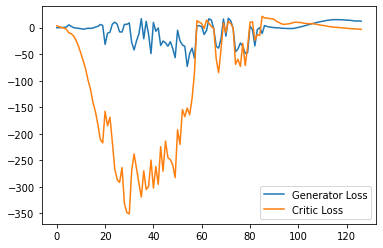

Step 2600: Generator loss: 12.594290752410888, critic loss: -3.667945544242859


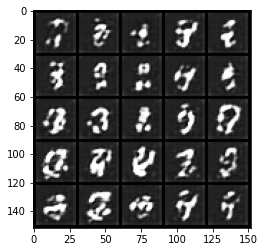

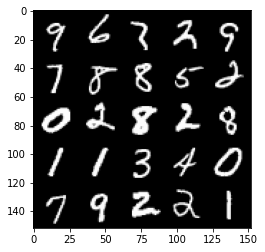

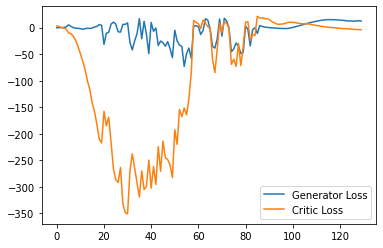

Step 2650: Generator loss: 12.292160701751708, critic loss: -4.80075977897644


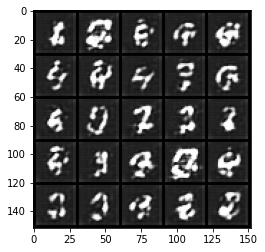

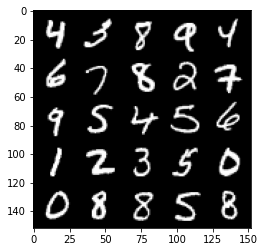

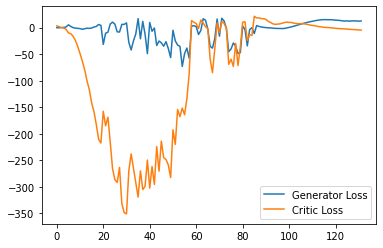

Step 2700: Generator loss: 11.61302508354187, critic loss: -6.619700239181517


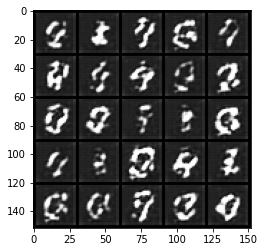

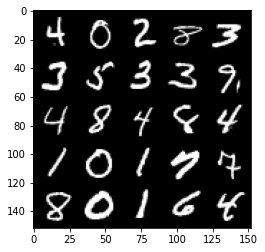

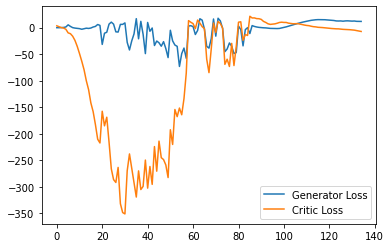

Step 2750: Generator loss: 10.945105237960815, critic loss: -8.680973667144773


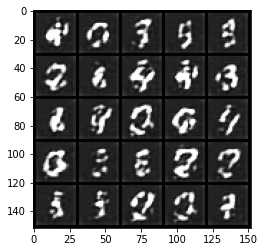

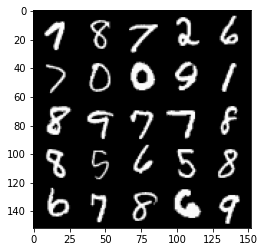

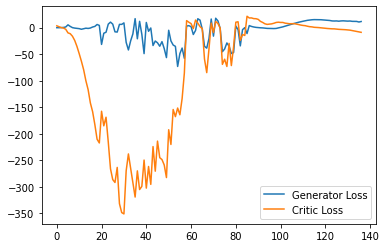

Step 2800: Generator loss: 9.114280729293823, critic loss: -10.059525970458985


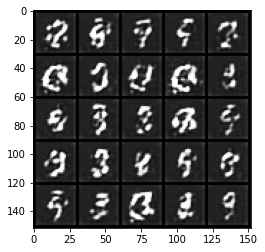

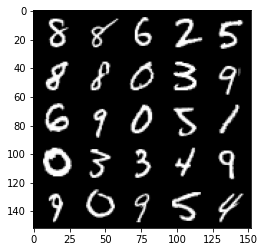

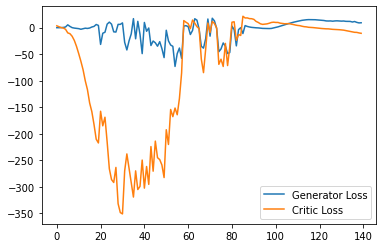

Step 2850: Generator loss: 8.549563465118409, critic loss: -11.30138214111328


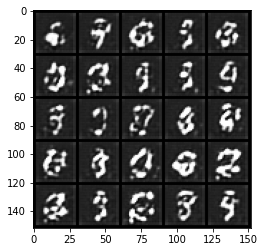

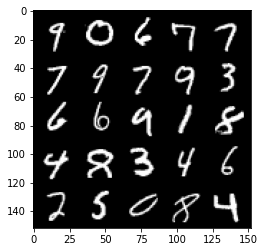

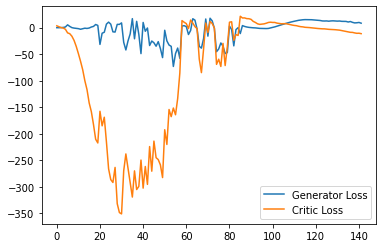

Step 2900: Generator loss: 8.089001244306564, critic loss: -12.595117210388187


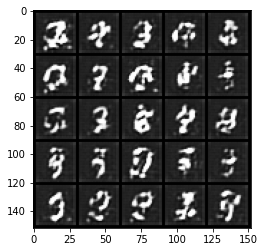

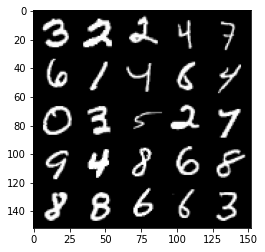

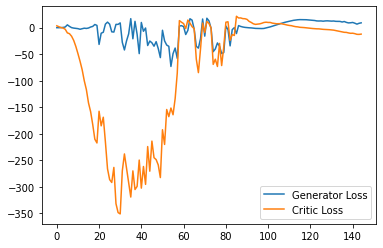

Step 2950: Generator loss: 7.663009121716023, critic loss: -12.880894224166871


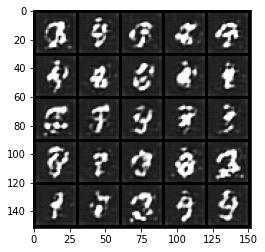

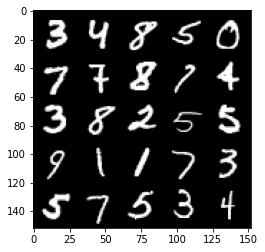

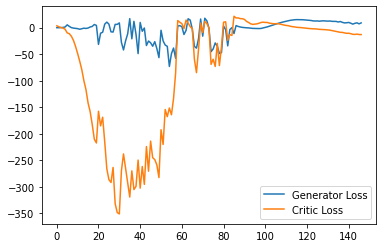

Step 3000: Generator loss: 7.505189676582813, critic loss: -13.56704334640503


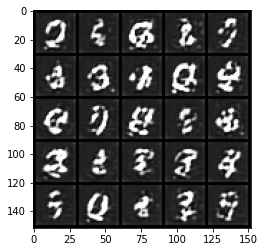

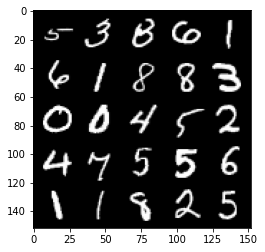

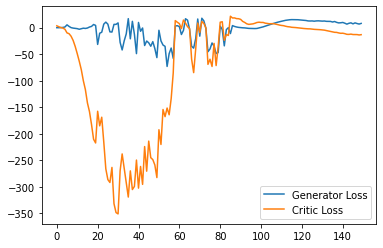

Step 3050: Generator loss: 6.426738930642605, critic loss: -15.74382024002075


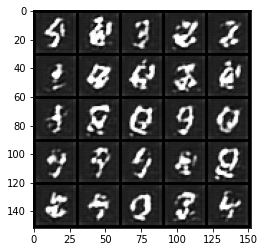

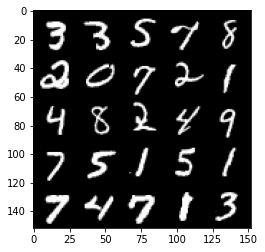

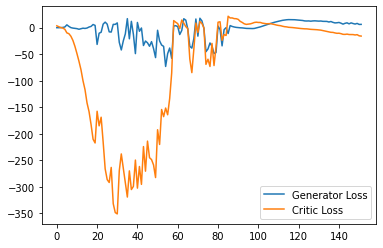

Step 3100: Generator loss: 7.444210646152496, critic loss: -17.666480054855352


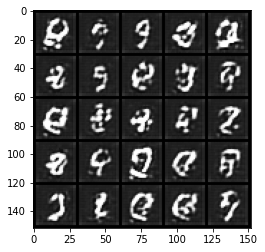

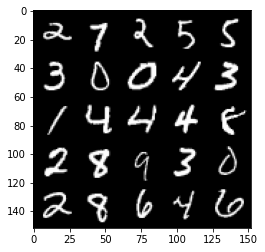

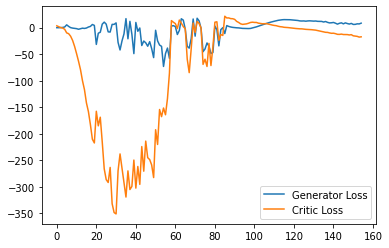

Step 3150: Generator loss: 5.433809642195701, critic loss: -18.373298320770267


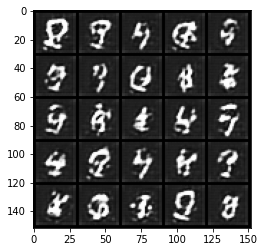

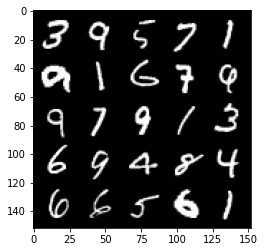

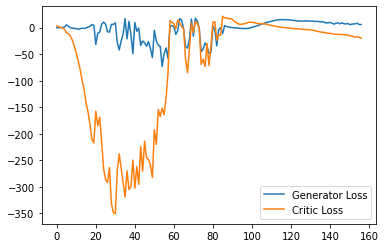

Step 3200: Generator loss: 6.876586332321167, critic loss: -19.9271265411377


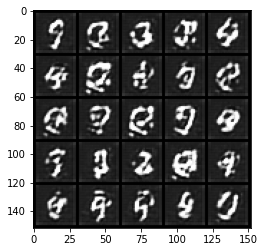

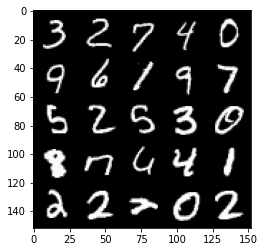

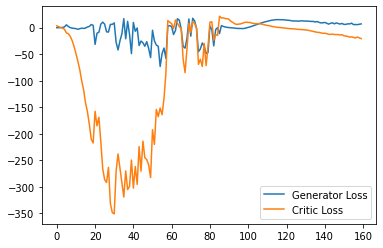

Step 3250: Generator loss: 6.6348101860284805, critic loss: -19.736986459732055


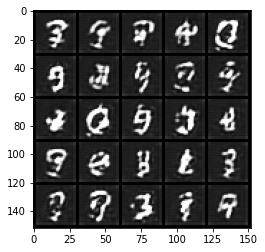

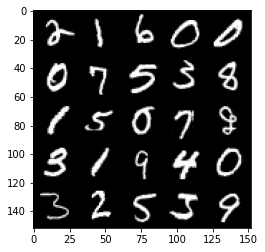

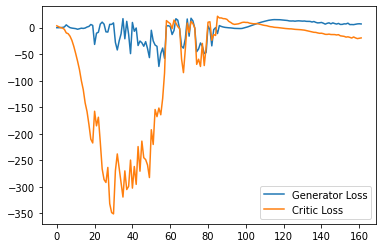

Step 3300: Generator loss: 6.356219680309295, critic loss: -20.337935802459707


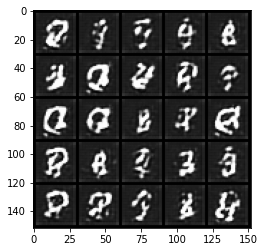

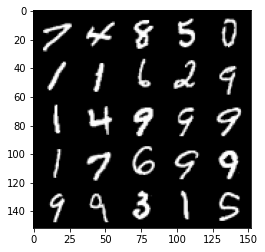

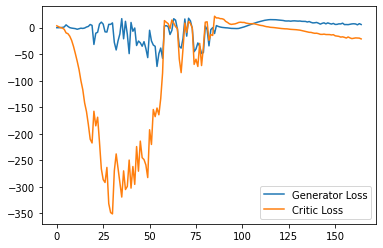

Step 3350: Generator loss: 5.989739489555359, critic loss: -20.55997245025635


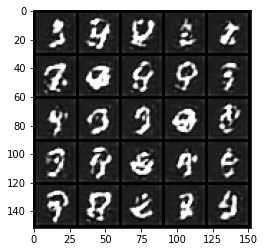

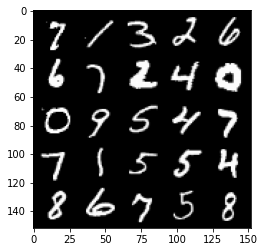

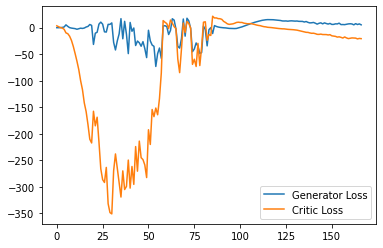

Step 3400: Generator loss: 4.636337810754776, critic loss: -20.25310642433167


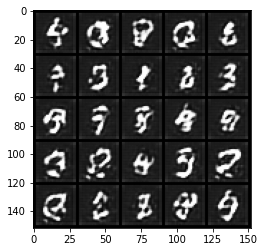

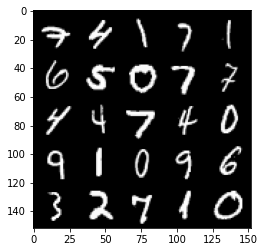

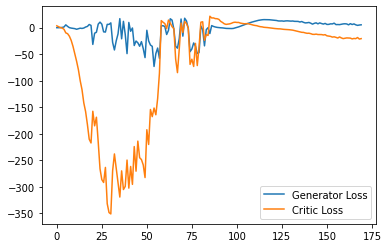

Step 3450: Generator loss: 5.490347152948379, critic loss: -20.769119182586664


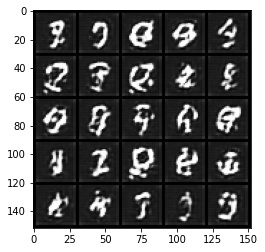

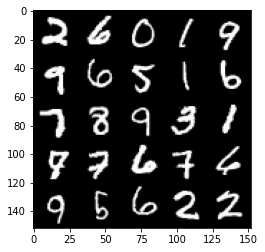

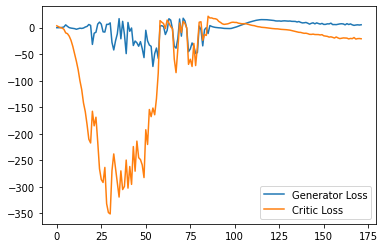

Step 3500: Generator loss: 4.0085747155547145, critic loss: -20.085344196319575


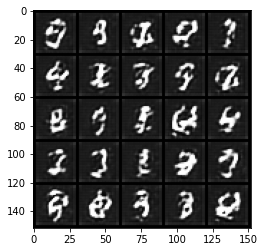

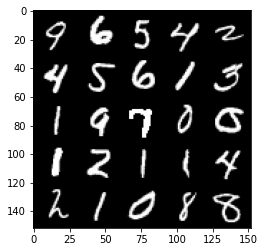

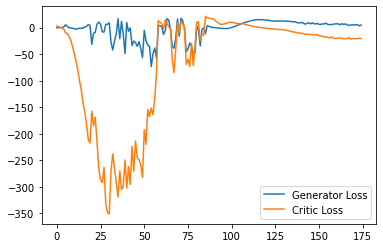

Step 3550: Generator loss: 3.8825891214609145, critic loss: -18.67462061882019


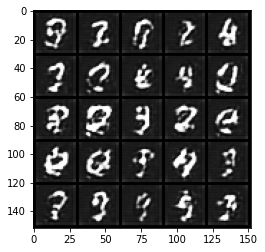

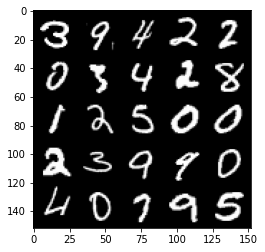

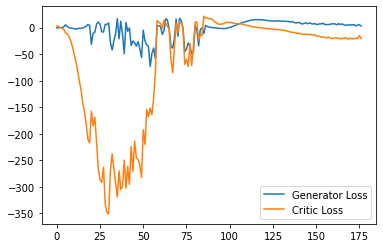

Step 3600: Generator loss: 1.5944855362176895, critic loss: -20.16378994750977


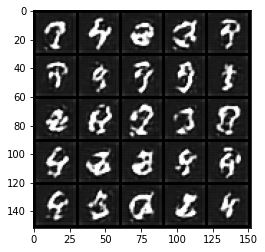

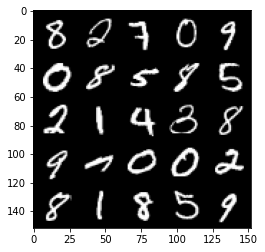

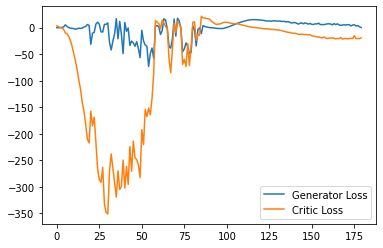

Step 3650: Generator loss: 2.3804329009354115, critic loss: -19.320608110427862


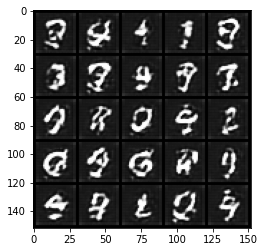

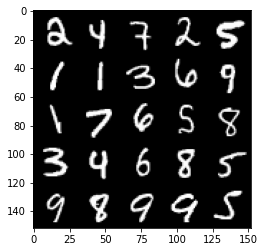

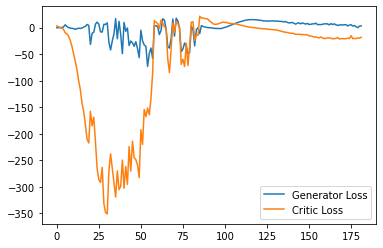

Step 3700: Generator loss: 3.6899267552793025, critic loss: -17.06228992080689


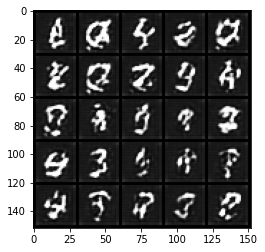

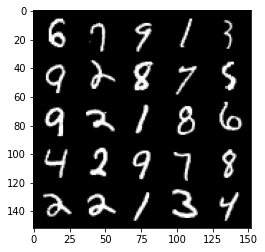

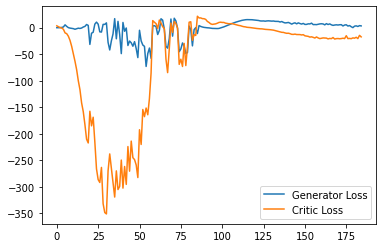

Step 3750: Generator loss: 3.0553728111088274, critic loss: -18.513266906738284


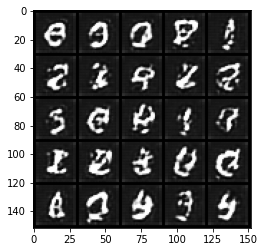

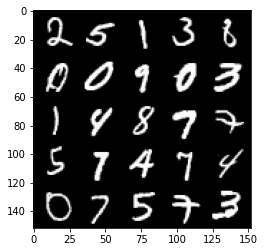

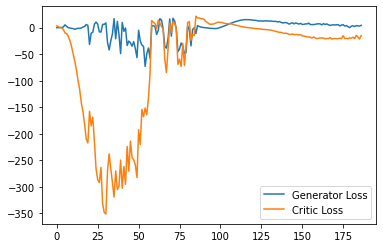

Step 3800: Generator loss: 2.2581007736176253, critic loss: -18.185192365646362


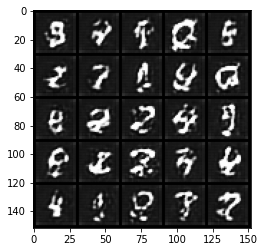

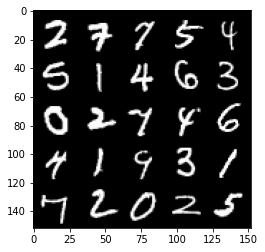

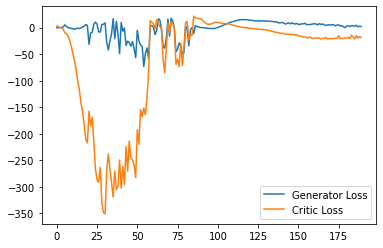

Step 3850: Generator loss: 1.6957227659225464, critic loss: -18.394454416275025


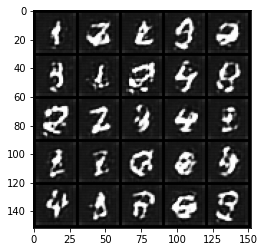

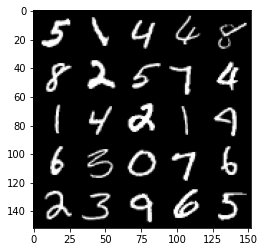

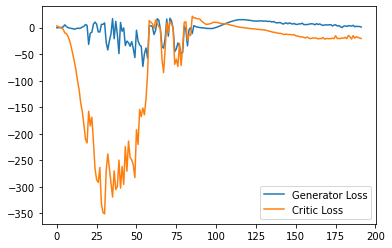

Step 3900: Generator loss: 3.555202139765024, critic loss: -19.229772192001338


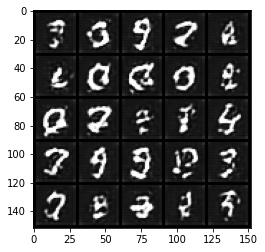

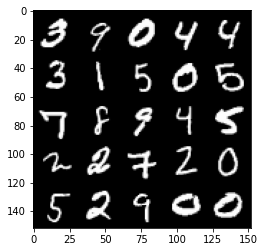

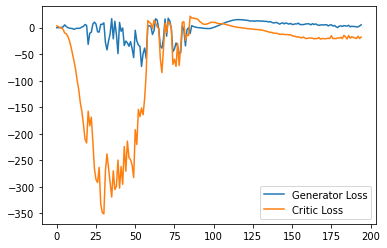

Step 3950: Generator loss: 1.469041813313961, critic loss: -19.692099691390993


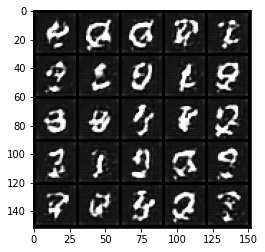

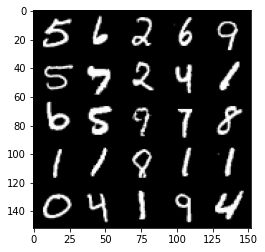

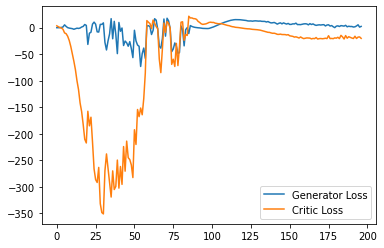

Step 4000: Generator loss: 3.5398286229372022, critic loss: -18.504605051994325


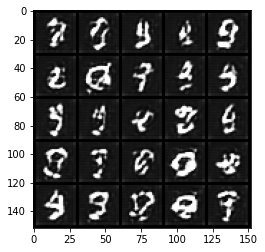

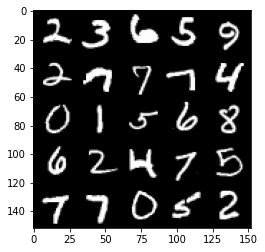

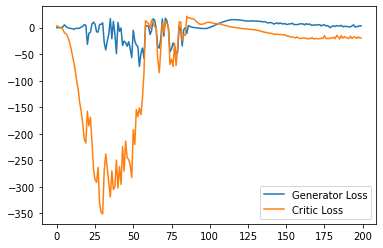

Step 4050: Generator loss: 3.810020841360092, critic loss: -20.48990629005432


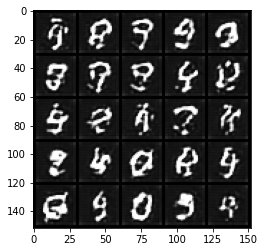

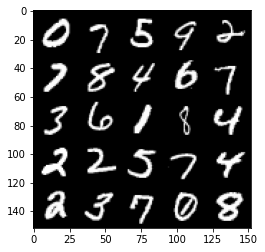

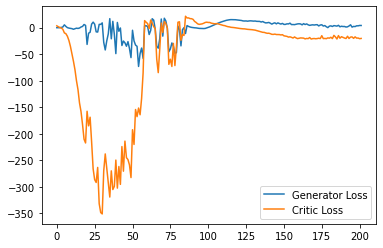

Step 4100: Generator loss: 3.677993166297674, critic loss: -19.404465967178343


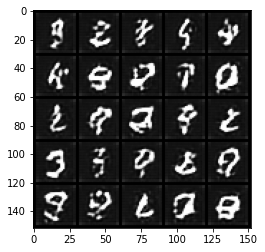

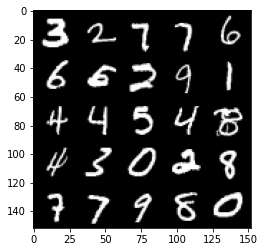

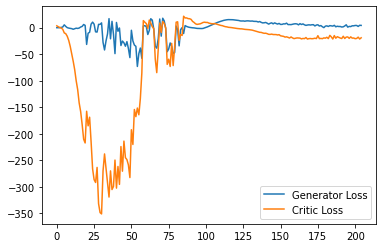

Step 4150: Generator loss: 5.117796595096588, critic loss: -19.705829963684085


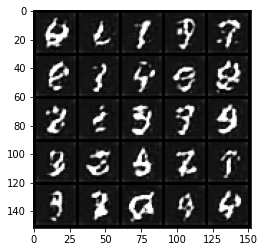

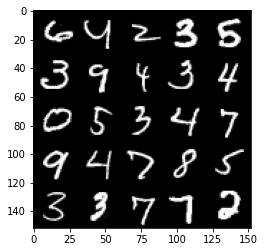

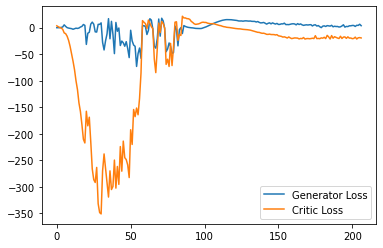

Step 4200: Generator loss: 5.417237831056118, critic loss: -17.53491748332977


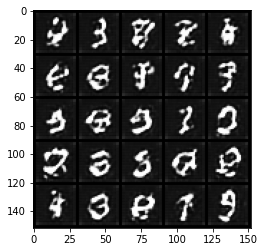

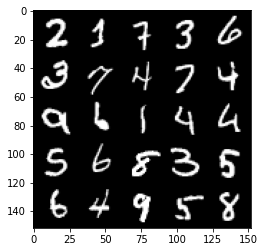

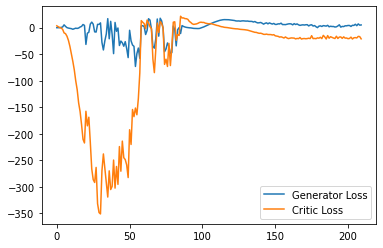

Step 4250: Generator loss: 6.802631384134292, critic loss: -14.946129918098444


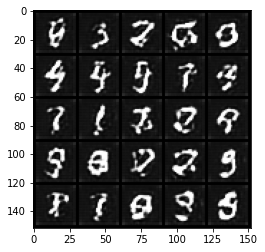

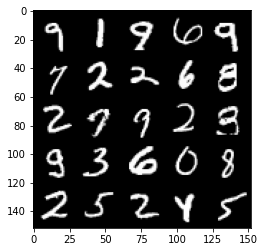

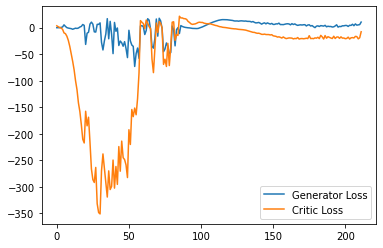

Step 4300: Generator loss: 4.400145864486694, critic loss: -19.684101771354687


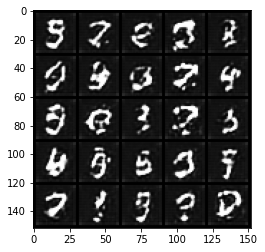

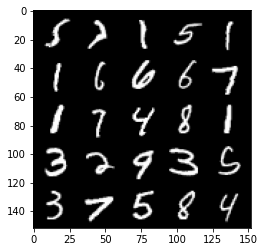

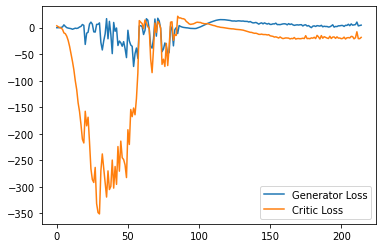

Step 4350: Generator loss: 6.050208401679993, critic loss: -17.404553440094002


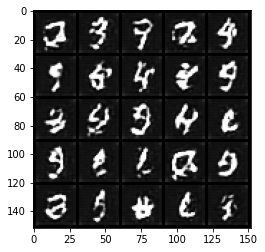

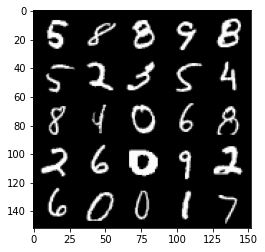

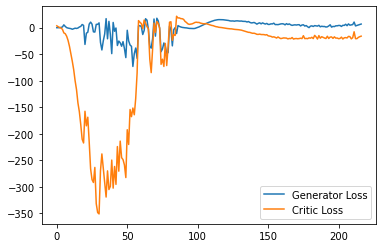

Step 4400: Generator loss: 8.181635761857033, critic loss: -14.11837020683288


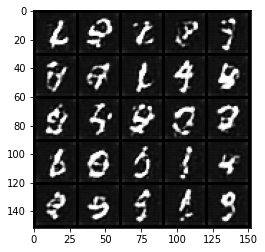

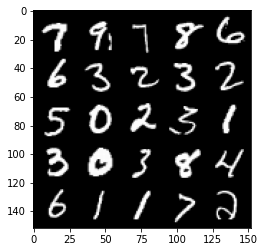

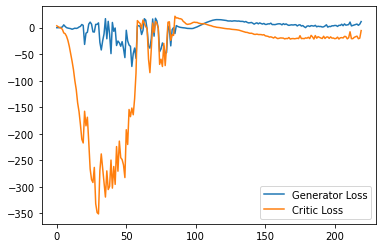

Step 4450: Generator loss: 6.555251009464264, critic loss: -15.759709258079532


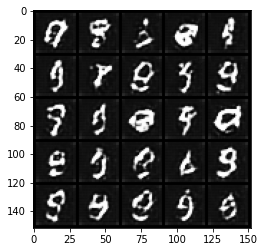

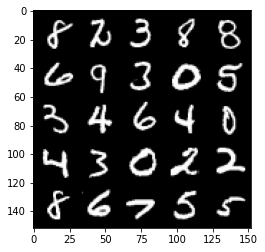

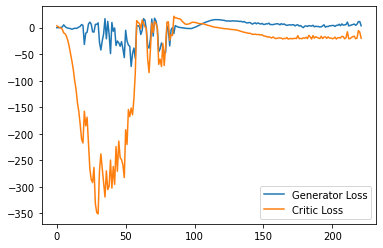

Step 4500: Generator loss: 5.529578466415405, critic loss: -18.244300088882447


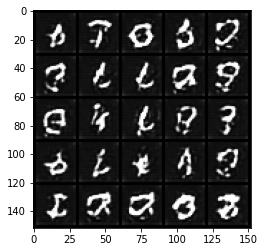

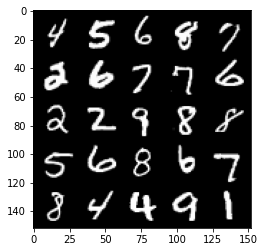

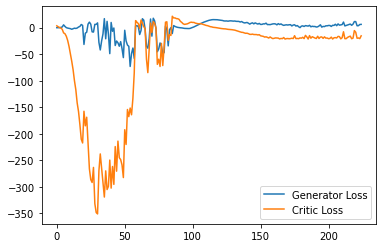

Step 4550: Generator loss: 4.946473906934261, critic loss: -20.54328373336792


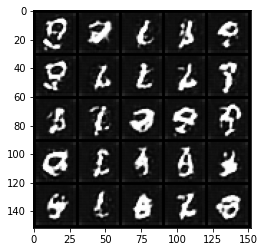

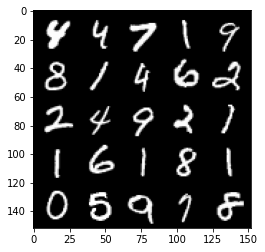

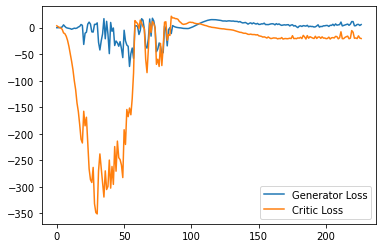

Step 4600: Generator loss: 7.899308363050222, critic loss: -18.772458392143246


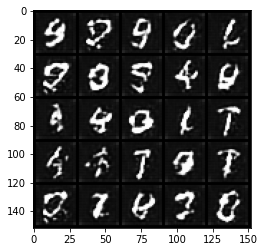

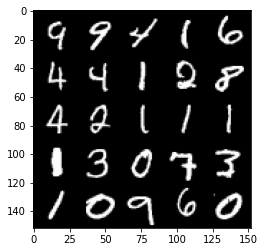

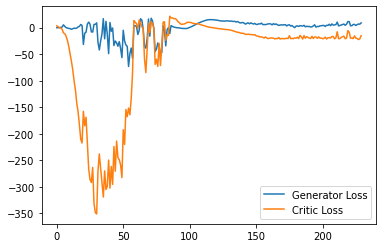

Step 4650: Generator loss: 9.654792293310166, critic loss: -14.692745356559753


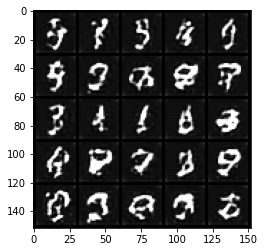

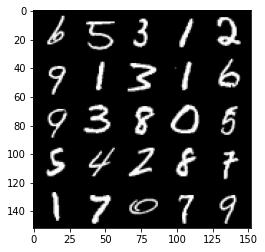

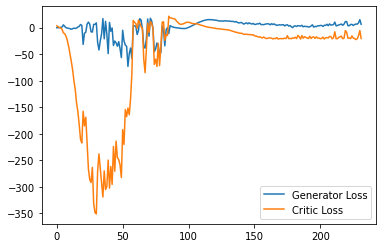

Step 4700: Generator loss: 10.644498167932033, critic loss: -9.425995673179624


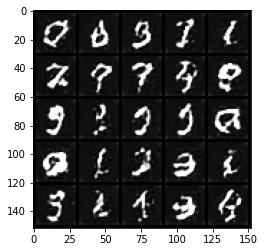

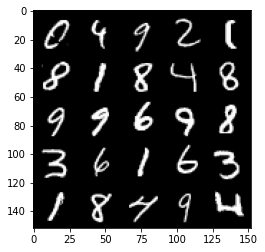

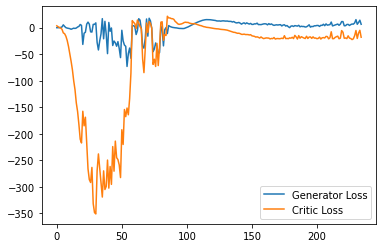

Step 4750: Generator loss: 7.2524978542327885, critic loss: -20.130655779838563


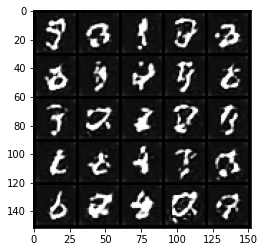

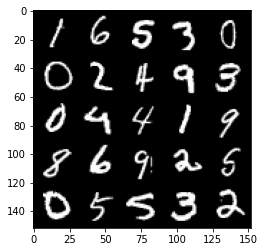

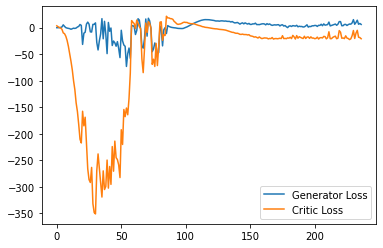

Step 4800: Generator loss: 8.123654423952102, critic loss: -18.614637897014617


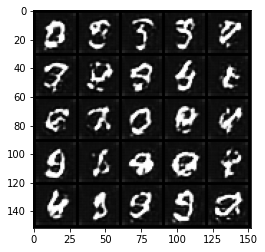

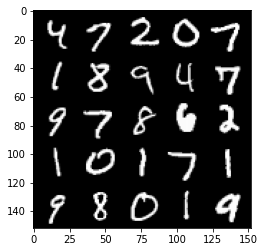

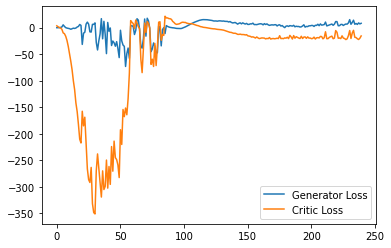

Step 4850: Generator loss: 10.18897216975689, critic loss: -15.131293198585514


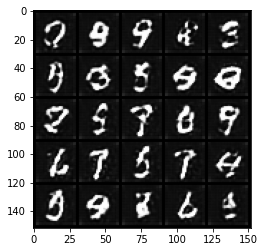

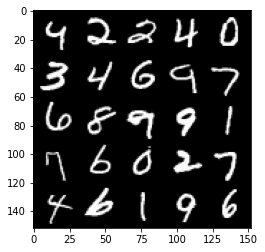

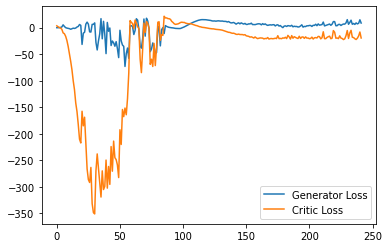

Step 4900: Generator loss: 7.6367060458660125, critic loss: -16.1169593296051


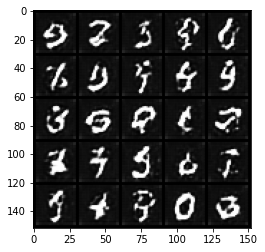

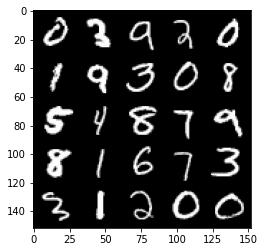

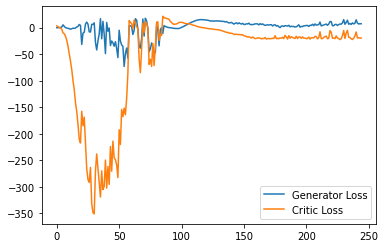

Step 4950: Generator loss: 14.03316370010376, critic loss: -2.8317745933532708


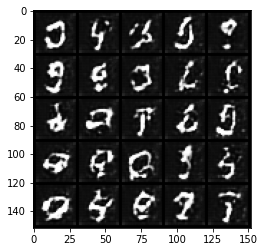

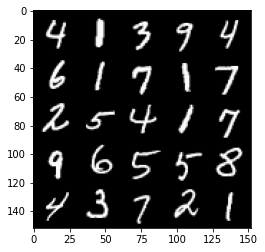

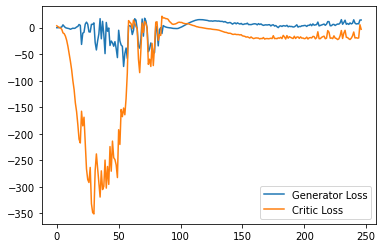

Step 5000: Generator loss: 8.850715609192848, critic loss: -6.59155147600174


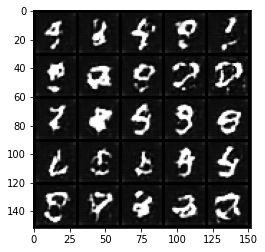

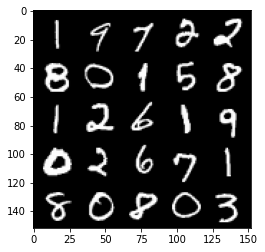

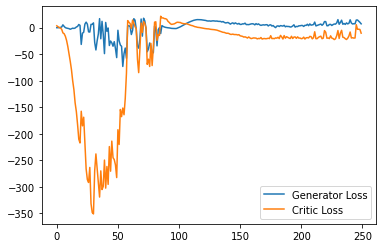

Step 5050: Generator loss: 6.6597086572647095, critic loss: -19.21828705406189


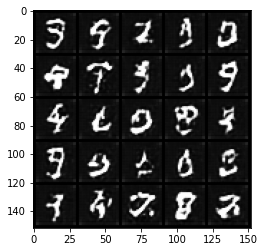

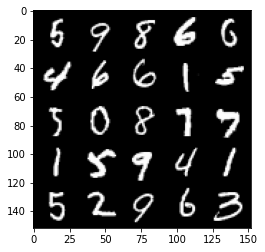

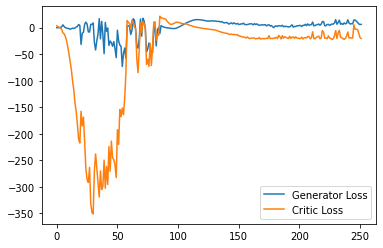

Step 5100: Generator loss: 8.290808891057969, critic loss: -17.26383874893189


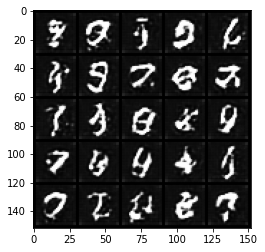

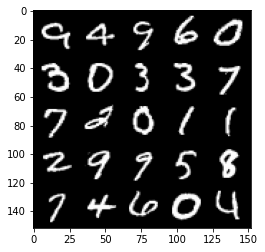

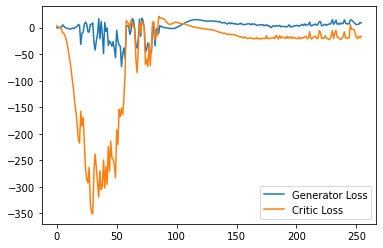

Step 5150: Generator loss: 10.027611329555512, critic loss: -9.810770169496537


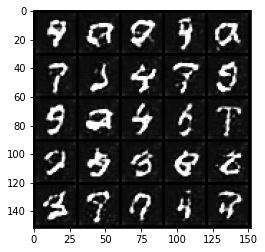

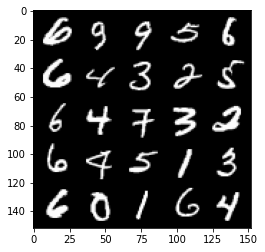

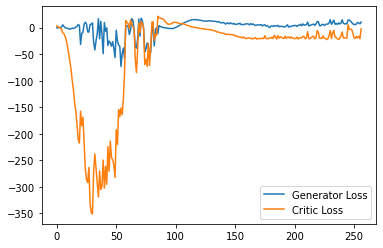

Step 5200: Generator loss: 8.095238035917282, critic loss: -20.063279935359954


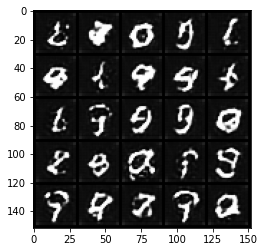

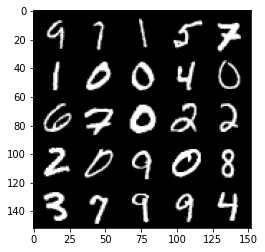

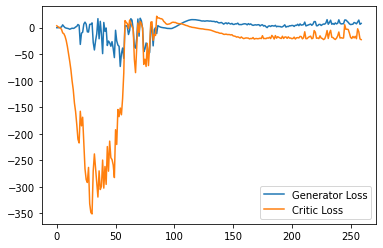

Step 5250: Generator loss: 9.768885116577149, critic loss: -14.885763000488275


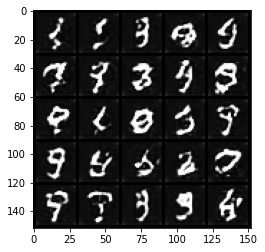

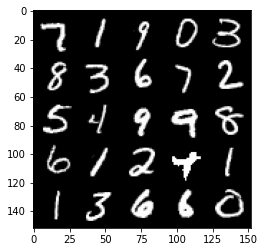

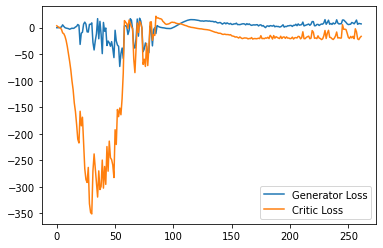

Step 5300: Generator loss: 8.614795362949371, critic loss: -17.590060514450077


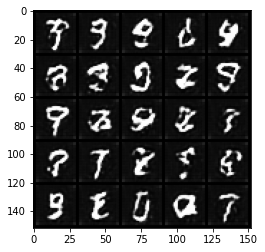

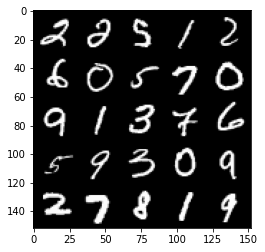

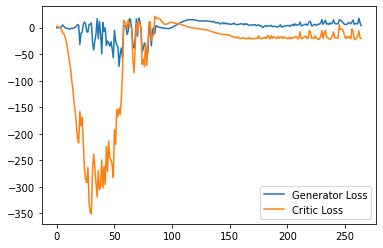

Step 5350: Generator loss: 7.722240560054779, critic loss: -20.902443512916562


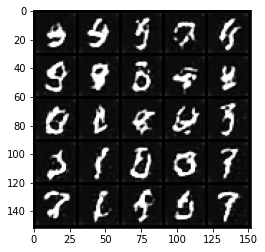

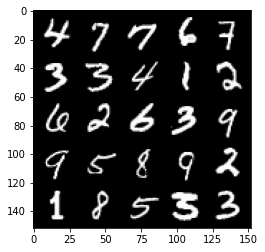

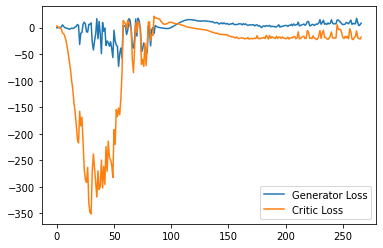

Step 5400: Generator loss: 6.722956593036652, critic loss: -20.447027743816378


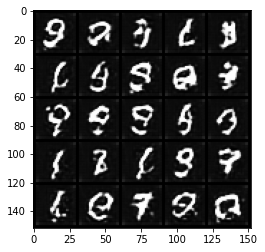

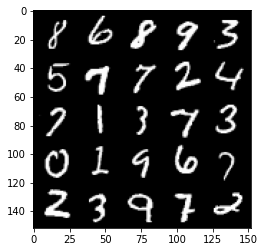

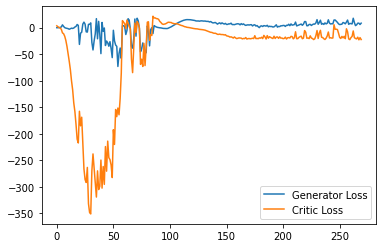

Step 5450: Generator loss: 15.301410427093506, critic loss: -2.905711112976073


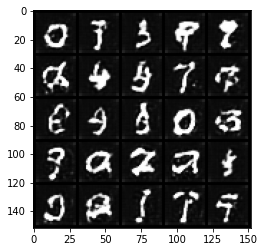

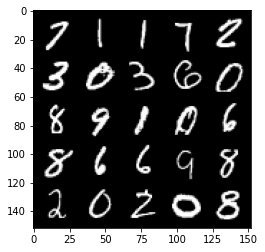

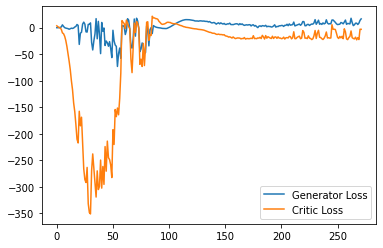

Step 5500: Generator loss: 6.276672171950341, critic loss: -16.04717691898346


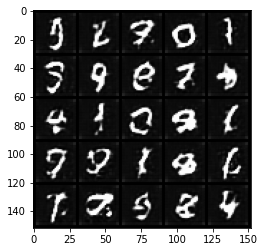

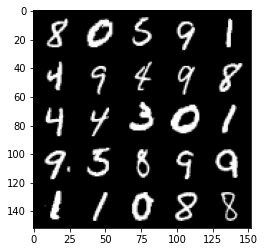

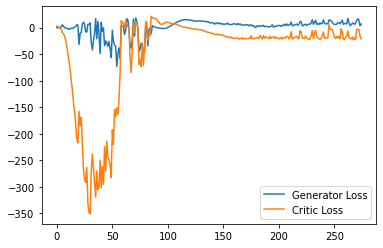

Step 5550: Generator loss: 6.104877544045448, critic loss: -20.270276426792144


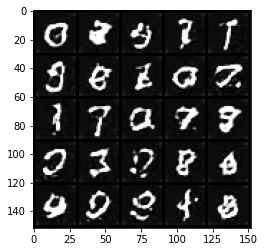

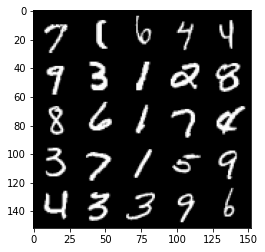

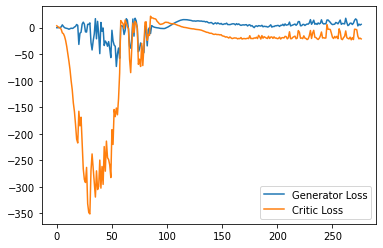

Step 5600: Generator loss: 6.268920025229454, critic loss: -21.826073225498195


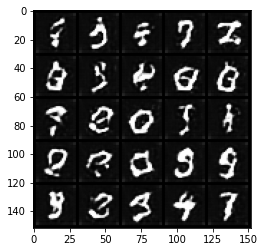

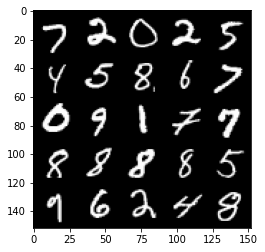

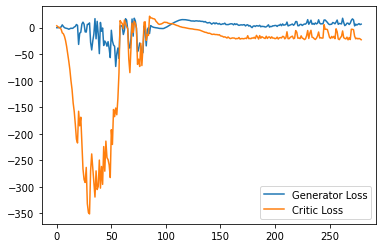

Step 5650: Generator loss: 13.450818674564362, critic loss: -1.0566488137245167


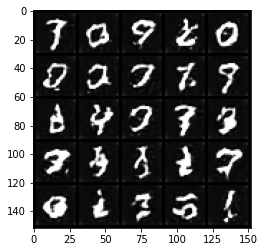

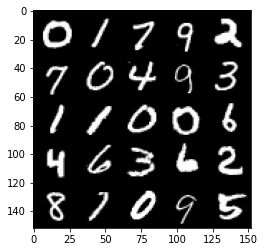

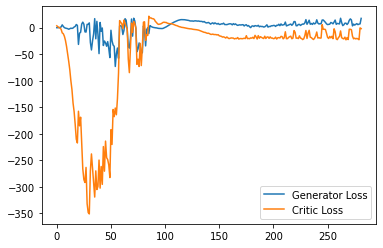

Step 5700: Generator loss: 14.3287917137146, critic loss: -2.0218606972694393


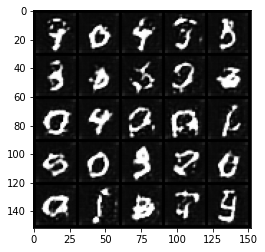

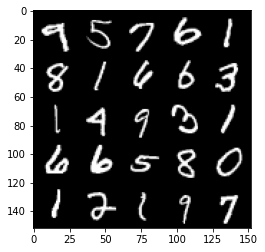

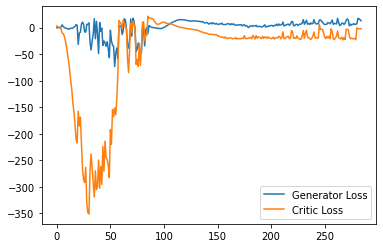

Step 5750: Generator loss: 11.018656997680663, critic loss: -2.195485915660858


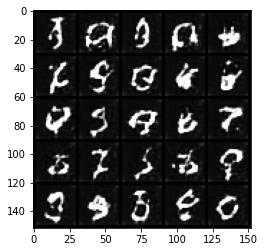

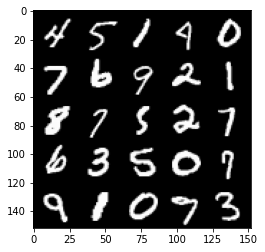

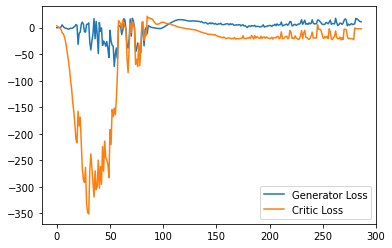

Step 5800: Generator loss: 10.682046566009522, critic loss: -2.566514878273011


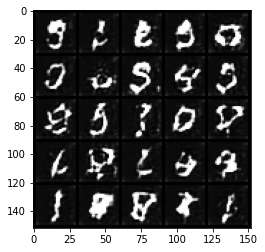

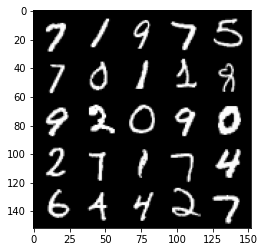

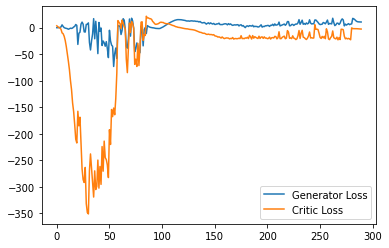

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
